In [ ]:
import urllib.request

urllib.request.urlretrieve("https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420937484-1629951672/carpet.tar.xz", "carpet.tar.xz")

import tarfile

with tarfile.open("carpet.tar.xz") as f:
  f.extractall('.')

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

image_path = "/content/carpet/test/hole/000.png"
image = Image.open(image_path)
image.size

In [ ]:
from torchvision import transforms

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

In [ ]:
image.size

(1024, 1024)

In [ ]:
image_resized = transform(image)
image_resized.shape

torch.Size([3, 224, 224])

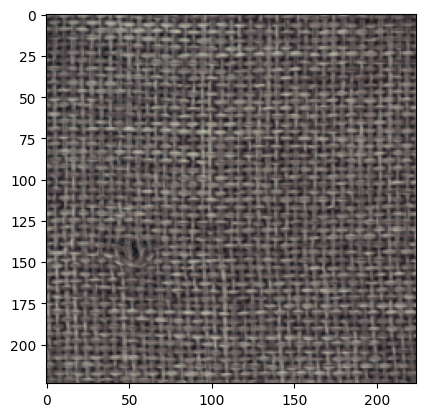

In [ ]:
plt.imshow(image_resized.permute(1, 2, 0))
plt.show()

In [ ]:
memory_usage = image_resized.numel() * image_resized.element_size()

print(f"Memory usage of tensor: {memory_usage * 279//1024} KB")

Memory usage of tensor: 164052 KB


In [ ]:
from torchvision.datasets import ImageFolder

good_dataset = ImageFolder("/content/carpet/train", transform=transform)

x, y = good_dataset[0]

print("Image Shape: ",x.shape)
print("Label: ", y)

In [ ]:
import torch

train_dataset, test_dataset = torch.utils.data.random_split(good_dataset, [0.8, 0.2])

print("Total number of samples in the original dataset: ", len(good_dataset))
print("Number of samples in the training dataset: ", len(train_dataset))
print("Number of samples in the test dataset: ", len(test_dataset))

In [ ]:
from torch.utils.data import DataLoader

BS = 16

train_loader = DataLoader(train_dataset, batch_size=BS, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=BS, shuffle=True)

image_batch, label_batch = next(iter(train_loader))

print("Image Shape: ",image_batch.shape)
print("Label Shape: ", label_batch.shape)

memory_usage = image_batch.numel() * image_batch.element_size()

print(f"Memory usage of tensor: {memory_usage//1024} KB")

In [ ]:
import torchvision

plt.figure(figsize=(12*4, 48*4))

grid = torchvision.utils.make_grid(image_batch[0:4], padding=5, nrow=4)

plt.imshow(grid.permute(1, 2, 0))
plt.title('Good Samples')
plt.show()

# **Auto Encoder**

In [ ]:
import torch.nn.functional as F
from torch import nn

input_image = Image.open(r'/content/carpet/train/good/000.png')
input_image = transform(input_image)

plt.imshow(input_image.permute(1, 2, 0))
plt.show()

print("init: ", input_image.shape)

input_image = input_image.unsqueeze(0)
print("after unsqueeze: ", input_image.shape)

c1 = nn.Conv2d(in_channels=3, out_channels=128, kernel_size=4)
x = c1(input_image)
print("after conv: ", x.shape)

ap1 = nn.AvgPool2d(kernel_size=2, stride=2)
x = ap1(x)
print("after 1st avg pool: ", x.shape)

c2 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=4)
ap2 = nn.AvgPool2d(kernel_size=2, stride=2)
x = ap2(c2(x))
print("after 2nd conv&avg: ", x.shape)

c3 = nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3)
ap3 = nn.AvgPool2d(kernel_size=2, stride=2)
x = ap3(c3(x))
print("after 3rd conv&avg: ", x.shape)

c4 = nn.ConvTranspose2d(in_channels=256, out_channels=256, kernel_size=4, stride=2, output_padding=1)
x = c4(x)
print("after 1st deconv: ", x.shape)

c5 = nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=5, stride=2, output_padding=1)
x = c5(x)
print("after 2nd deconv: ", x.shape)

c6 = nn.ConvTranspose2d(in_channels=128, out_channels=3, kernel_size=5, stride=2, output_padding=1)
x = c6(x)
print("after 3rd deconv: ", x.shape)

In [ ]:
class AutoEncoder(nn.Module):
  def __init__(self):
    super(AutoEncoder, self).__init__()
    self.encoder = nn.Sequential(
        nn.Conv2d(3,128,kernel_size=4),
        nn.ReLU(),
        nn.AvgPool2d(kernel_size=2, stride=2),
        nn.Conv2d(128,256,kernel_size=4),
        nn.ReLU(),
        nn.AvgPool2d(kernel_size=2, stride=2),
        nn.Conv2d(256,256,kernel_size=3),
        nn.ReLU(),
        nn.AvgPool2d(kernel_size=2, stride=2)
    )
    self.decoder = nn.Sequential(
        nn.ConvTranspose2d(256,256,kernel_size=4, stride=2, output_padding=1),
        nn.ReLU(),
        nn.ConvTranspose2d(256,128,kernel_size=5, stride=2, output_padding=1),
        nn.ReLU(),
        nn.ConvTranspose2d(128,3,kernel_size=5, stride=2, output_padding=1),
        nn.Sigmoid()
    )

  def forward(self, x):
    x = self.encoder(x)
    x = self.decoder(x)
    return x

In [ ]:
model = AutoEncoder()
input_image = torch.randn(1, 3, 224, 224)
output_image = model(input_image)
print(output_image.shape)

torch.Size([1, 3, 224, 224])


In [ ]:
model.cuda()
criterion = torch.nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

  1%|          | 1/100 [00:13<22:31, 13.66s/it]

Epoch: 0 / 100, Loss: 0.011940349824726582, Validation Loss: 0.012829778948798776


  6%|▌         | 6/100 [01:24<22:27, 14.33s/it]

Epoch: 5 / 100, Loss: 0.008430089801549911, Validation Loss: 0.009011163841933012


 11%|█         | 11/100 [02:34<20:37, 13.90s/it]

Epoch: 10 / 100, Loss: 0.006144751328974962, Validation Loss: 0.006326088914647698


 16%|█▌        | 16/100 [03:50<20:36, 14.72s/it]

Epoch: 15 / 100, Loss: 0.005227226298302412, Validation Loss: 0.005624597892165184


 21%|██        | 21/100 [05:00<18:39, 14.16s/it]

Epoch: 20 / 100, Loss: 0.0051343441009521484, Validation Loss: 0.005299676093272865


 26%|██▌       | 26/100 [06:09<17:07, 13.88s/it]

Epoch: 25 / 100, Loss: 0.004805346019566059, Validation Loss: 0.00494996109046042


 31%|███       | 31/100 [07:18<15:56, 13.87s/it]

Epoch: 30 / 100, Loss: 0.004572615958750248, Validation Loss: 0.004709869623184204


 36%|███▌      | 36/100 [08:26<14:35, 13.68s/it]

Epoch: 35 / 100, Loss: 0.004462329670786858, Validation Loss: 0.004731503548100591


 41%|████      | 41/100 [09:35<13:33, 13.78s/it]

Epoch: 40 / 100, Loss: 0.004426110070198774, Validation Loss: 0.004501029965467751


 46%|████▌     | 46/100 [10:46<12:35, 13.99s/it]

Epoch: 45 / 100, Loss: 0.004424512851983309, Validation Loss: 0.004379026009701192


 51%|█████     | 51/100 [11:54<11:13, 13.74s/it]

Epoch: 50 / 100, Loss: 0.004344253800809383, Validation Loss: 0.004226885037496686


 56%|█████▌    | 56/100 [13:03<10:05, 13.76s/it]

Epoch: 55 / 100, Loss: 0.0038406362291425467, Validation Loss: 0.004081661463715136


 61%|██████    | 61/100 [14:12<08:58, 13.81s/it]

Epoch: 60 / 100, Loss: 0.004133808426558971, Validation Loss: 0.004169716616161168


 66%|██████▌   | 66/100 [15:20<07:45, 13.70s/it]

Epoch: 65 / 100, Loss: 0.003825265448540449, Validation Loss: 0.003911746840458363


 71%|███████   | 71/100 [16:29<06:38, 13.75s/it]

Epoch: 70 / 100, Loss: 0.003875960595905781, Validation Loss: 0.003824820800218731


 76%|███████▌  | 76/100 [17:38<05:28, 13.69s/it]

Epoch: 75 / 100, Loss: 0.003574261674657464, Validation Loss: 0.0036488696932792664


 81%|████████  | 81/100 [18:46<04:20, 13.69s/it]

Epoch: 80 / 100, Loss: 0.0035416162572801113, Validation Loss: 0.003638339461758733


 86%|████████▌ | 86/100 [19:55<03:12, 13.77s/it]

Epoch: 85 / 100, Loss: 0.0035387820098549128, Validation Loss: 0.0035354223800823092


 91%|█████████ | 91/100 [21:05<02:05, 13.94s/it]

Epoch: 90 / 100, Loss: 0.003335022833198309, Validation Loss: 0.0035518378717824817


 96%|█████████▌| 96/100 [22:23<01:00, 15.02s/it]

Epoch: 95 / 100, Loss: 0.0033788145519793034, Validation Loss: 0.0034175229957327247


100%|██████████| 100/100 [23:21<00:00, 14.02s/it]


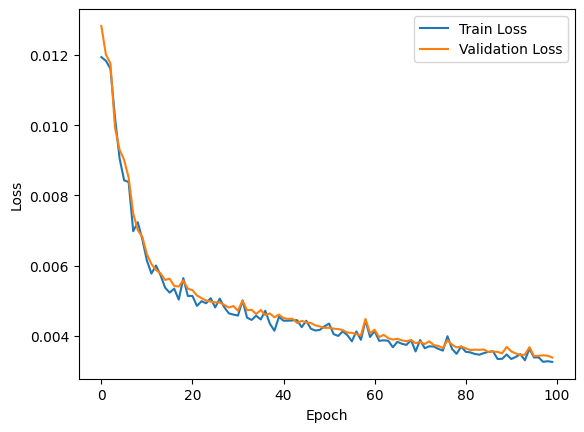

In [ ]:
Loss = []
Validation_Loss = []

from tqdm import tqdm
EPOCHS = 100
for epoch in tqdm(range(EPOCHS)):
  model.train()
  for img, _ in train_loader:
    img = img.cuda()
    output = model(img)
    loss = criterion(output, img)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
  Loss.append(loss.item())


  model.eval()
  with torch.no_grad():
    val_loss_sum = 0.0
    num_batches = 0
    for img, _ in test_loader:
      img = img.cuda()
      output = model(img)
      val_loss = criterion(output, img)
      val_loss_sum += val_loss.item()
      num_batches += 1
    val_loss_avg = val_loss_sum / num_batches
    Validation_Loss.append(val_loss_avg)

  if epoch % 5 == 0:
    print(f"Epoch: {epoch} / {EPOCHS}, Loss: {loss.item()}, Validation Loss: {val_loss_avg}")

plt.plot(Loss, label='Train Loss')
plt.plot(Validation_Loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
torch.save(model.state_dict(), 'autoencoder_v1.pth')
model.eval()

AutoEncoder(
  (encoder): Sequential(
    (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(1, 1))
    (1): ReLU()
    (2): AvgPool2d(kernel_size=2, stride=2, padding=0)
    (3): Conv2d(128, 256, kernel_size=(4, 4), stride=(1, 1))
    (4): ReLU()
    (5): AvgPool2d(kernel_size=2, stride=2, padding=0)
    (6): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1))
    (7): ReLU()
    (8): AvgPool2d(kernel_size=2, stride=2, padding=0)
  )
  (decoder): Sequential(
    (0): ConvTranspose2d(256, 256, kernel_size=(4, 4), stride=(2, 2), output_padding=(1, 1))
    (1): ReLU()
    (2): ConvTranspose2d(256, 128, kernel_size=(5, 5), stride=(2, 2), output_padding=(1, 1))
    (3): ReLU()
    (4): ConvTranspose2d(128, 3, kernel_size=(5, 5), stride=(2, 2), output_padding=(1, 1))
    (5): Sigmoid()
  )
)

In [ ]:
ckpoints = torch.load('autoencoder_v1.pth')
# model = AutoEncoder() need to run if loading from other env
model.load_state_dict(ckpoints)

<All keys matched successfully>

# **Reconstruction**

In [ ]:
with torch.no_grad():
  for data, _ in train_loader:
    data = data.cuda()
    recon = model(data)
    break

recon_error = ((data - recon)**2).mean(axis=1)
print(recon_error.shape)

torch.Size([16, 224, 224])


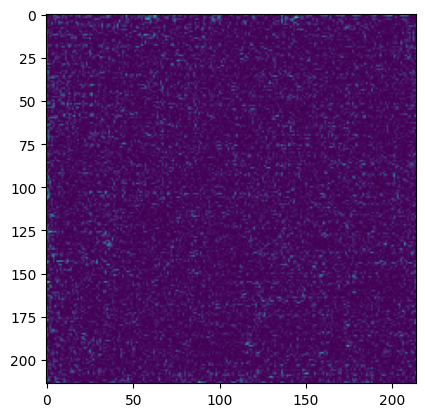

In [ ]:
plt.imshow(recon_error[0][0:-10, 0:-10].cpu().numpy())

<Figure size 1600x1200 with 0 Axes>

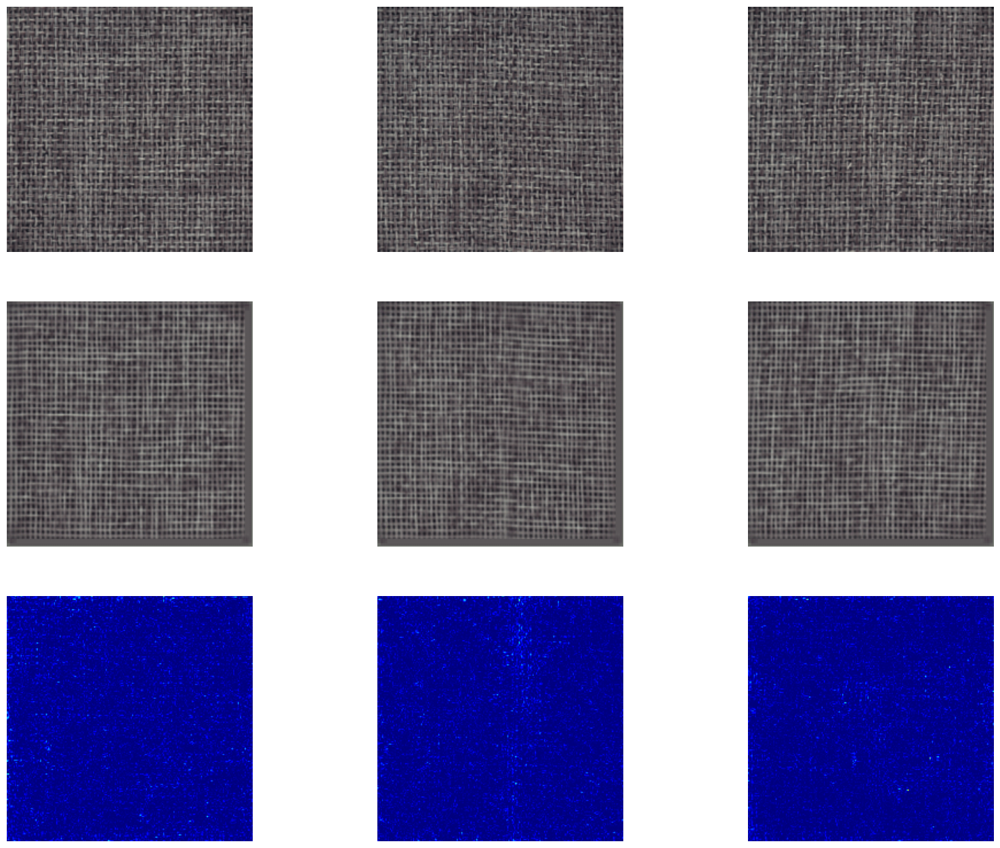

In [ ]:
plt.figure(dpi=250)
fig, ax = plt.subplots(3, 3, figsize=(5*4, 4*4))
for i in range(3):
  ax[0, i].imshow(data[i].cpu().numpy().transpose((1, 2, 0)))
  ax[1, i].imshow(recon[i].cpu().numpy().transpose((1, 2, 0)))
  ax[2, i].imshow(recon_error[i][0:-10, 0:-10].cpu().numpy(), cmap='jet', vmax=torch.max(recon_error[i]))
  ax[0, i].axis('OFF')
  ax[1, i].axis('OFF')
  ax[2, i].axis('OFF')
plt.show()

In [ ]:
data_list = [None]*3
data_list[0] = torch.stack([transform(Image.open(f'/content/carpet/test/color/00{i}.png')) for i in range(3)])
data_list[1] = torch.stack([transform(Image.open(f'/content/carpet/test/cut/00{i}.png')) for i in range(3)])
data_list[2] = torch.stack([transform(Image.open(f'/content/carpet/test/hole/00{i}.png')) for i in range(3)])

<Figure size 1600x1200 with 0 Axes>

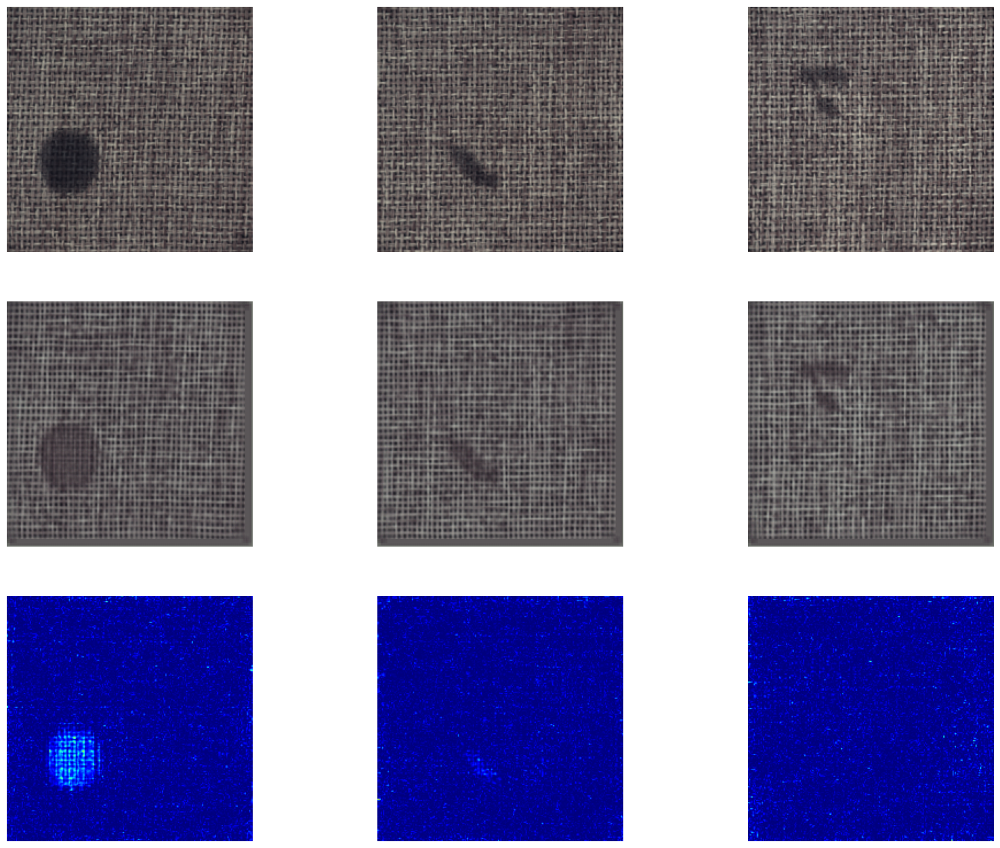

In [ ]:
with torch.no_grad():
  data = data_list[0].cuda()
  recon = model(data)

recon_error = ((data - recon)**2).mean(axis=1)

plt.figure(dpi=250)
fig, ax = plt.subplots(3, 3, figsize=(5*4, 4*4))
for i in range(3):
  ax[0, i].imshow(data[i].cpu().numpy().transpose((1, 2, 0)))
  ax[1, i].imshow(recon[i].cpu().numpy().transpose((1, 2, 0)))
  ax[2, i].imshow(recon_error[i][0:-10, 0:-10].cpu().numpy(), cmap='jet', vmax=torch.max(recon_error[i]))
  ax[0, i].axis('OFF')
  ax[1, i].axis('OFF')
  ax[2, i].axis('OFF')
plt.show()

<Figure size 1600x1200 with 0 Axes>

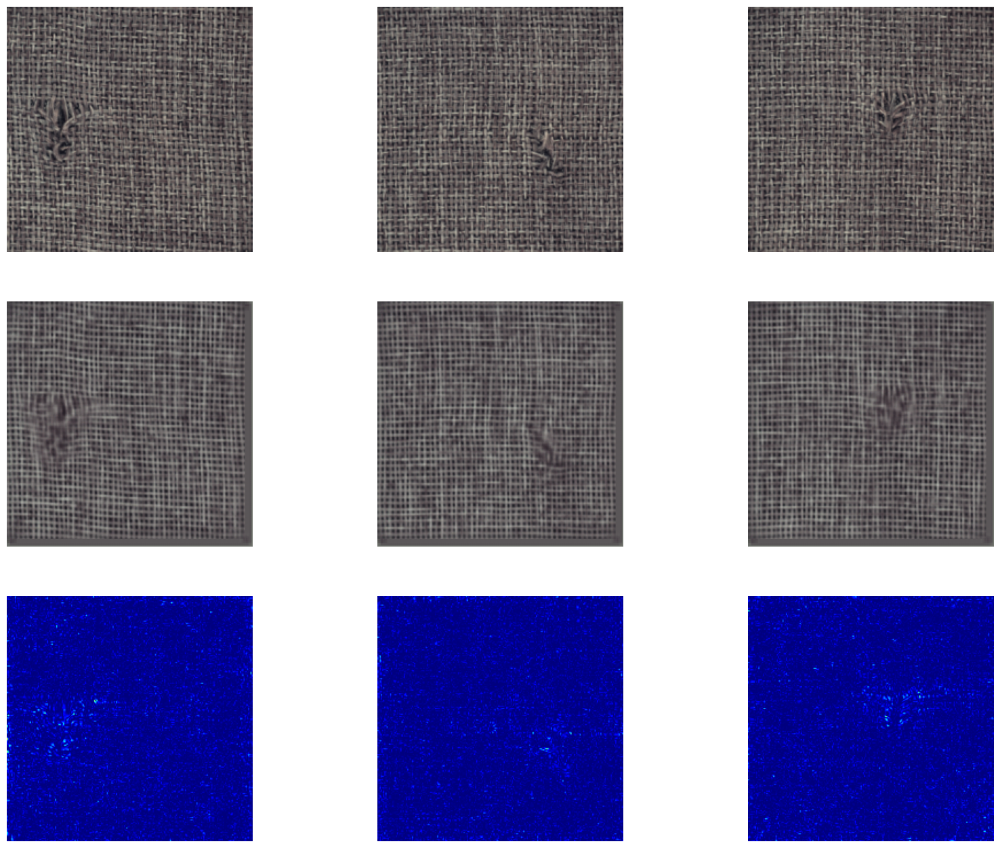

In [ ]:
with torch.no_grad():
  data = data_list[1].cuda()
  recon = model(data)

recon_error = ((data - recon)**2).mean(axis=1)

plt.figure(dpi=250)
fig, ax = plt.subplots(3, 3, figsize=(5*4, 4*4))
for i in range(3):
  ax[0, i].imshow(data[i].cpu().numpy().transpose((1, 2, 0)))
  ax[1, i].imshow(recon[i].cpu().numpy().transpose((1, 2, 0)))
  ax[2, i].imshow(recon_error[i][0:-10, 0:-10].cpu().numpy(), cmap='jet', vmax=torch.max(recon_error[i]))
  ax[0, i].axis('OFF')
  ax[1, i].axis('OFF')
  ax[2, i].axis('OFF')
plt.show()

<Figure size 1600x1200 with 0 Axes>

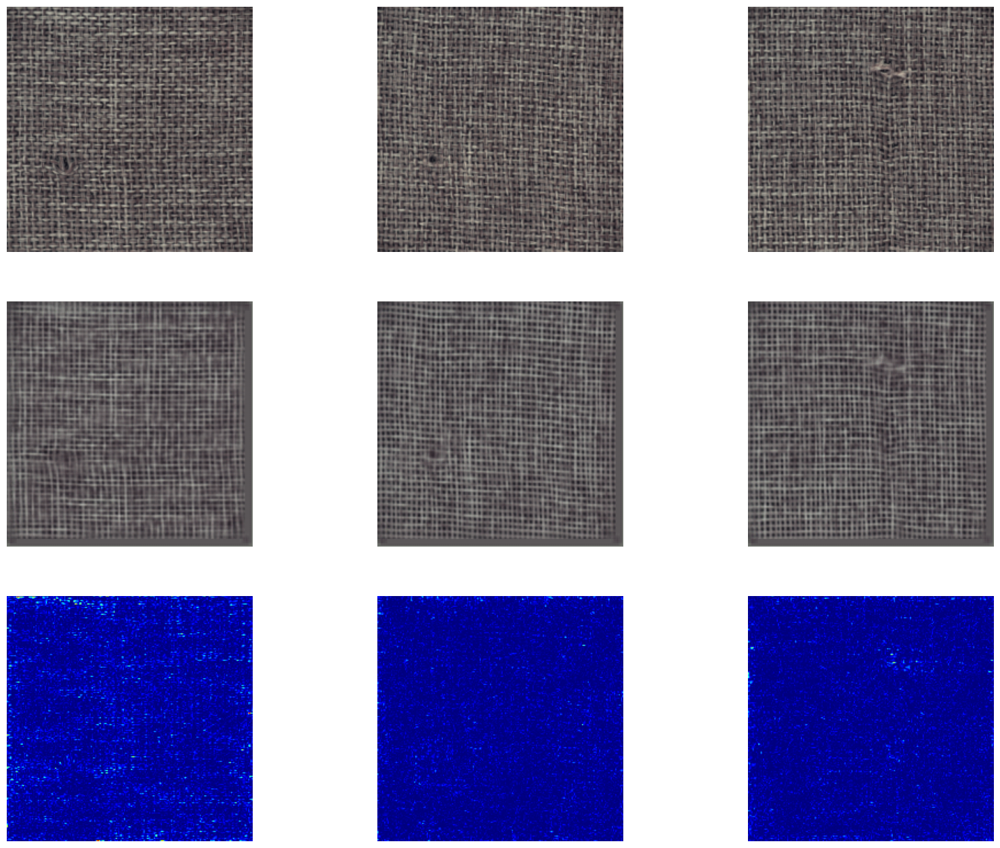

In [ ]:
with torch.no_grad():
  data = data_list[2].cuda()
  recon = model(data)

recon_error = ((data - recon)**2).mean(axis=1)

plt.figure(dpi=250)
fig, ax = plt.subplots(3, 3, figsize=(5*4, 4*4))
for i in range(3):
  ax[0, i].imshow(data[i].cpu().numpy().transpose((1, 2, 0)))
  ax[1, i].imshow(recon[i].cpu().numpy().transpose((1, 2, 0)))
  ax[2, i].imshow(recon_error[i][0:-10, 0:-10].cpu().numpy(), cmap='jet', vmax=torch.max(recon_error[i]))
  ax[0, i].axis('OFF')
  ax[1, i].axis('OFF')
  ax[2, i].axis('OFF')
plt.show()

In [ ]:
recon_error_values = []
with torch.no_grad():
  for data, _ in train_loader:
    data = data.cuda()
    recon = model(data)
    data_recon_MSE = ((data - recon)**2).mean(axis=(1))[:, 0:-10, 0:-10].mean(axis=(1, 2))
    recon_error_values.append(data_recon_MSE)

recon_error_values = torch.cat(recon_error_values).cpu().numpy()

In [ ]:
import numpy as np
opt_thresh = np.mean(recon_error_values) + 3 * np.std(recon_error_values)

plt.hist(recon_error_values, bins=50)
plt.vlines(x=opt_thresh, color='r', ymin=0, ymax=30)
plt.show()

In [ ]:
y_true = []
y_pred = []
y_score = []

model.eval()

from pathlib import Path


with torch.no_grad():

  test = Path('/content/carpet/test')
  for path in test.glob('*/*.png'):
    fault_type = path.parts[-2]
    test_image = transform(Image.open(path)).cuda().unsqueeze(0)
    recon_image = model(test_image)

    y_score_image = ((test_image - recon_image)**2).mean(axis=(1))[:,0:-10, 0:-10].mean()

    y_pred_image = 1*(y_score_image >= opt_thresh)

    y_true_image = 0 if fault_type == 'good' else 1

    y_true.append(y_true_image)
    y_pred.append(y_pred_image.cpu())
    y_score.append(y_score_image.cpu())

y_true = np.array(y_true)
y_pred = np.array(y_pred)
y_score = np.array(y_score)

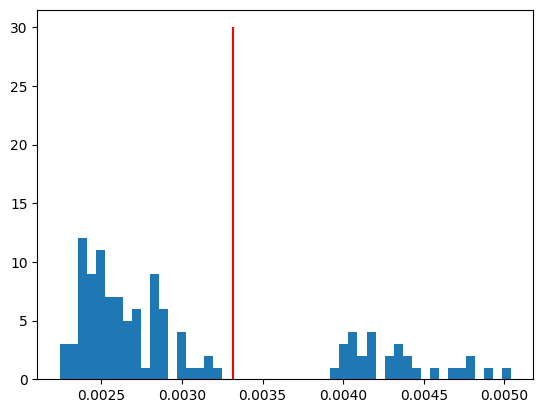

In [ ]:
plt.hist(y_score, bins=50)
plt.vlines(x=opt_thresh, color='r', ymin=0, ymax=30)
plt.show()

In [ ]:
from sklearn.metrics import roc_auc_score, roc_curve
import seaborn as sns

auc_roc_score = roc_auc_score(y_true, y_score)
print("AUC-ROC Score: ", auc_roc_score)

fpr, tpr, thresholds = roc_curve(y_true, y_score)
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % auc_roc_score)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# **ResNet50**

In [ ]:
from torchvision.models import resnet50, ResNet50_Weights

In [ ]:
transform = transforms.Compose([
  transforms.Resize((224, 224)),
  transforms.ToTensor(),
])

train_image_path = Path('/content/carpet/train')

good_dataset = ImageFolder(train_image_path, transform=transform)
train_dataset, test_dataset = torch.utils.data.random_split(good_dataset, [0.8, 0.2])

BS = 16

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=BS, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=BS, shuffle=False)

In [ ]:
resnet_model = resnet50(weights=ResNet50_Weights.DEFAULT)

for layer in resnet_model.named_parameters():
  print(layer[0])

conv1.weight
bn1.weight
bn1.bias
layer1.0.conv1.weight
layer1.0.bn1.weight
layer1.0.bn1.bias
layer1.0.conv2.weight
layer1.0.bn2.weight
layer1.0.bn2.bias
layer1.0.conv3.weight
layer1.0.bn3.weight
layer1.0.bn3.bias
layer1.0.downsample.0.weight
layer1.0.downsample.1.weight
layer1.0.downsample.1.bias
layer1.1.conv1.weight
layer1.1.bn1.weight
layer1.1.bn1.bias
layer1.1.conv2.weight
layer1.1.bn2.weight
layer1.1.bn2.bias
layer1.1.conv3.weight
layer1.1.bn3.weight
layer1.1.bn3.bias
layer1.2.conv1.weight
layer1.2.bn1.weight
layer1.2.bn1.bias
layer1.2.conv2.weight
layer1.2.bn2.weight
layer1.2.bn2.bias
layer1.2.conv3.weight
layer1.2.bn3.weight
layer1.2.bn3.bias
layer2.0.conv1.weight
layer2.0.bn1.weight
layer2.0.bn1.bias
layer2.0.conv2.weight
layer2.0.bn2.weight
layer2.0.bn2.bias
layer2.0.conv3.weight
layer2.0.bn3.weight
layer2.0.bn3.bias
layer2.0.downsample.0.weight
layer2.0.downsample.1.weight
layer2.0.downsample.1.bias
layer2.1.conv1.weight
layer2.1.bn1.weight
layer2.1.bn1.bias
layer2.1.conv2.we

In [ ]:
#layer 2 output layer2.3.bn3.bias
#layer 3 output layer3.5.bn3.bias

In [ ]:
def hook(model, input, output):
  feature.append(output.detach())

In [ ]:
feature = []

resnet_model.layer2[-1].register_forward_hook(hook)
resnet_model.layer3[-1].register_forward_hook(hook)

_ = resnet_model(torch.randn(1,3,224,224))

In [ ]:
feature[0].shape

torch.Size([1, 512, 28, 28])

In [ ]:
feature[1].shape

torch.Size([1, 1024, 14, 14])

In [ ]:
len(feature)

2

In [ ]:
resnet_model.layer2[-1]

Bottleneck(
  (conv1): Conv2d(512, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(128, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn3): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
)

In [ ]:
resnet_model.layer3[-1]

Bottleneck(
  (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
)

# **ResNet Feature Extractor Class**

In [ ]:
class resnet_feature_extractor(nn.Module):
  def __init__(self):
    super(resnet_feature_extractor, self).__init__()
    self.model = resnet50(weights=ResNet50_Weights.DEFAULT)

    self.model.eval()
    for param in self.model.parameters():
      param.requires_grad = False

    def hook(model, input, output):
      self.features.append(output)

    self.model.layer2[-1].register_forward_hook(hook)
    self.model.layer3[-1].register_forward_hook(hook)

  def forward(self, input):
    self.features = []
    with torch.no_grad():
      _ = self.model(input)

    self.avg = torch.nn.AvgPool2d(3, stride=1)
    fmap_size = self.features[0].shape[-2]
    self.resize = torch.nn.AdaptiveAvgPool2d(fmap_size)

    resized_maps = [self.resize(self.avg(fmap)) for fmap in self.features]
    patch = torch.cat(resized_maps, 1)

    return patch

torch.Size([1, 512, 28, 28])
torch.Size([1, 1024, 14, 14])
torch.Size([1, 1536, 28, 28])


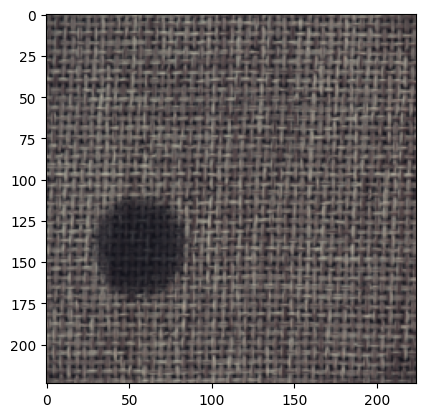

In [ ]:
image = Image.open('/content/carpet/test/color/000.png')
image = transform(image)
image = image.unsqueeze(0)
backbone = resnet_feature_extractor()
feature = backbone(image)

print(backbone.features[0].shape)
print(backbone.features[1].shape)
print(feature.shape)

plt.imshow(image[0].permute(1,2,0))

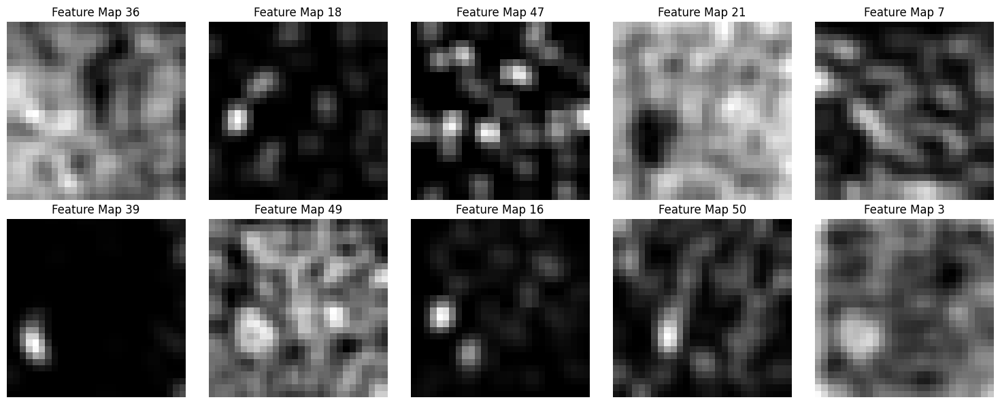

In [ ]:
indices = torch.randperm(64)[:10]

fig, axes = plt.subplots(2, 5, figsize=(15, 6))
for i, index in enumerate(indices):
  row = i // 5
  col = i % 5
  axes[row, col].imshow(feature[0, index].detach().cpu(), cmap='gray')
  axes[row, col].set_title(f'Feature Map {index}')
  axes[row, col].axis('off')
plt.tight_layout()
plt.show()

# **ResNet AutoEncoder**

In [ ]:
import torch.nn as nn

class FeatCAE(nn.Module):
    def __init__(self, in_channels=1000, latent_dim=50, is_bn=True):
        super(FeatCAE, self).__init__()

        layers = []
        layers += [nn.Conv2d(in_channels, (in_channels + 2 * latent_dim) // 2, kernel_size=1, stride=1, padding=0)]
        if is_bn:
            layers += [nn.BatchNorm2d(num_features=(in_channels + 2 * latent_dim) // 2)]
        layers += [nn.ReLU()]
        layers += [nn.Conv2d((in_channels + 2 * latent_dim) // 2, 2 * latent_dim, kernel_size=1, stride=1, padding=0)]
        if is_bn:
            layers += [nn.BatchNorm2d(num_features=2 * latent_dim)]
        layers += [nn.ReLU()]
        layers += [nn.Conv2d(2 * latent_dim, latent_dim, kernel_size=1, stride=1, padding=0)]

        self.encoder = nn.Sequential(*layers)

        layers = []
        layers += [nn.Conv2d(latent_dim, 2 * latent_dim, kernel_size=1, stride=1, padding=0)]
        if is_bn:
            layers += [nn.BatchNorm2d(num_features=2 * latent_dim)]
        layers += [nn.ReLU()]
        layers += [nn.Conv2d(2 * latent_dim, (in_channels + 2 * latent_dim) // 2, kernel_size=1, stride=1, padding=0)]
        if is_bn:
            layers += [nn.BatchNorm2d(num_features=(in_channels + 2 * latent_dim) // 2)]
        layers += [nn.ReLU()]
        layers += [nn.Conv2d((in_channels + 2 * latent_dim) // 2, in_channels, kernel_size=1, stride=1, padding=0)]

        self.decoder = nn.Sequential(*layers)

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

In [ ]:
import torch.optim as optim

model = FeatCAE(in_channels=1536, latent_dim=100).cuda()
backbone.cuda()

criterion = torch.nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

  2%|▏         | 1/50 [00:16<13:19, 16.32s/it]

Epoch: 0 / 50, Loss: 0.09108218550682068, Validation Loss: 0.2966661974787712


 12%|█▏        | 6/50 [01:31<11:04, 15.11s/it]

Epoch: 5 / 50, Loss: 0.024739349260926247, Validation Loss: 0.023732074070721865


 22%|██▏       | 11/50 [02:45<09:40, 14.87s/it]

Epoch: 10 / 50, Loss: 0.019424114376306534, Validation Loss: 0.019747729878872633


 32%|███▏      | 16/50 [04:00<08:26, 14.91s/it]

Epoch: 15 / 50, Loss: 0.016939358785748482, Validation Loss: 0.01698140474036336


 42%|████▏     | 21/50 [05:14<07:11, 14.86s/it]

Epoch: 20 / 50, Loss: 0.0143178915604949, Validation Loss: 0.014684198424220085


 52%|█████▏    | 26/50 [06:28<05:56, 14.86s/it]

Epoch: 25 / 50, Loss: 0.013072194531559944, Validation Loss: 0.013052846770733595


 62%|██████▏   | 31/50 [07:44<04:47, 15.14s/it]

Epoch: 30 / 50, Loss: 0.0114375539124012, Validation Loss: 0.0119373535271734


 72%|███████▏  | 36/50 [09:01<03:35, 15.37s/it]

Epoch: 35 / 50, Loss: 0.0110756391659379, Validation Loss: 0.011145653435960412


 82%|████████▏ | 41/50 [10:17<02:15, 15.05s/it]

Epoch: 40 / 50, Loss: 0.010349730029702187, Validation Loss: 0.010435770498588681


 92%|█████████▏| 46/50 [11:32<01:00, 15.04s/it]

Epoch: 45 / 50, Loss: 0.009760255925357342, Validation Loss: 0.010029342258349061


100%|██████████| 50/50 [12:31<00:00, 15.03s/it]


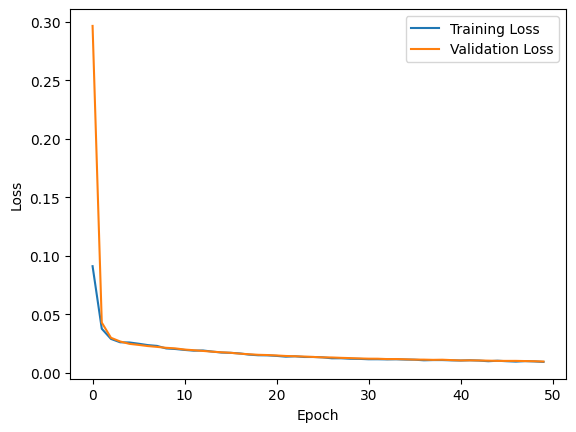

In [ ]:
Loss = []
Validation_Loss = []


EPOCHS = 50
for epoch in tqdm(range(EPOCHS)):
    model.train()
    for data,_ in train_loader:
        with torch.no_grad():
            features = backbone(data.cuda())
        output = model(features)
        loss = criterion(output, features)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    Loss.append(loss.item())

    model.eval()
    with torch.no_grad():
        val_loss_sum = 0.0
        num_batches = 0
        for data, _ in test_loader:
            features = backbone(data.cuda())
            output = model(features)
            val_loss = criterion(output, features)
            val_loss_sum += val_loss.item()
            num_batches += 1
        val_loss_avg = val_loss_sum / num_batches
        Validation_Loss.append(val_loss_avg)

    if epoch % 5 == 0:
      print(f"Epoch: {epoch} / {EPOCHS}, Loss: {loss.item()}, Validation Loss: {val_loss_avg}")

plt.plot(Loss, label='Training Loss')
plt.plot(Validation_Loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
torch.save(model.state_dict(), 'autoencoder_resnet.pth')
model.eval()

FeatCAE(
  (encoder): Sequential(
    (0): Conv2d(1536, 868, kernel_size=(1, 1), stride=(1, 1))
    (1): BatchNorm2d(868, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(868, 200, kernel_size=(1, 1), stride=(1, 1))
    (4): BatchNorm2d(200, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): Conv2d(200, 100, kernel_size=(1, 1), stride=(1, 1))
  )
  (decoder): Sequential(
    (0): Conv2d(100, 200, kernel_size=(1, 1), stride=(1, 1))
    (1): BatchNorm2d(200, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(200, 868, kernel_size=(1, 1), stride=(1, 1))
    (4): BatchNorm2d(868, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): Conv2d(868, 1536, kernel_size=(1, 1), stride=(1, 1))
  )
)

In [ ]:
ckpoints = torch.load('autoencoder_resnet.pth')
# model = AutoEncoder() need to run if loading from other env
model.load_state_dict(ckpoints)

model.eval()

FeatCAE(
  (encoder): Sequential(
    (0): Conv2d(1536, 868, kernel_size=(1, 1), stride=(1, 1))
    (1): BatchNorm2d(868, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(868, 200, kernel_size=(1, 1), stride=(1, 1))
    (4): BatchNorm2d(200, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): Conv2d(200, 100, kernel_size=(1, 1), stride=(1, 1))
  )
  (decoder): Sequential(
    (0): Conv2d(100, 200, kernel_size=(1, 1), stride=(1, 1))
    (1): BatchNorm2d(200, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(200, 868, kernel_size=(1, 1), stride=(1, 1))
    (4): BatchNorm2d(868, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): Conv2d(868, 1536, kernel_size=(1, 1), stride=(1, 1))
  )
)

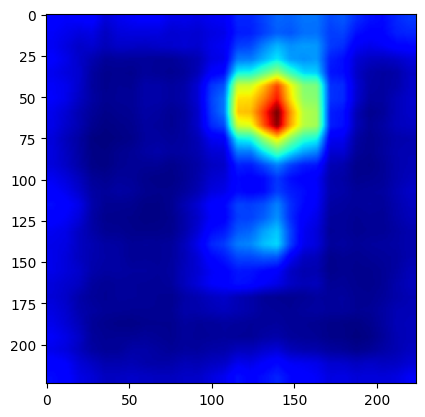

In [ ]:
image = Image.open('/content/carpet/test/hole/002.png')
image = transform(image)
image = image.unsqueeze(0)

with torch.no_grad():
  features = backbone(image.cuda())
  recon = model(features)

recon_error = ((features - recon)**2).mean(axis=(1)).unsqueeze(0)

segm_map = torch.nn.functional.interpolate(
    recon_error,
    size=(224, 224),
    mode='bilinear',
)

plt.imshow(segm_map.squeeze().cpu().numpy(), cmap='jet')
plt.show()

In [ ]:
def decision_function(segm_map):
  mean_top_10_values = []

  for map in segm_map:
    flattened_tensor = map.reshape(-1)

    sorted_tensor, _ = torch.sort(flattened_tensor, descending=True)

    top_10_values = sorted_tensor[:10]

    mean_top_10_value = sorted_tensor[:10].mean()

    mean_top_10_values.append(mean_top_10_value)

  return torch.stack(mean_top_10_values)

In [ ]:
model.eval()

recon_error_values = []
for data, _ in train_loader:
  with torch.no_grad():
    features = backbone(data.cuda()).squeeze()
    recon = model(features)
  segm_map = ((features - recon)**2).mean(axis=(1))[:,3:-3,3:-3]
  anomaly_score = decision_function(segm_map)

  recon_error_values.append(anomaly_score)

recon_error_values = torch.cat(recon_error_values).cpu().numpy()

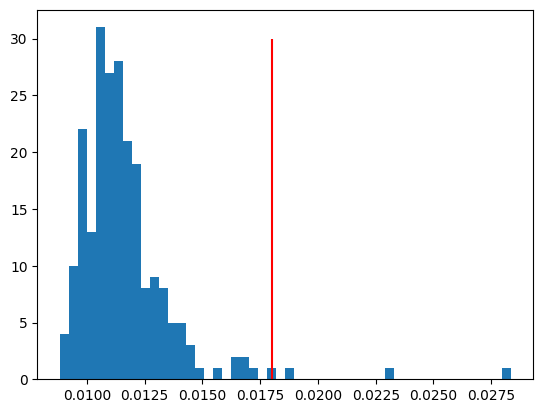

In [ ]:
opt_thresh = np.mean(recon_error_values) + 3 * np.std(recon_error_values)

heat_map_max, heat_map_min = np.max(recon_error_values), np.min(recon_error_values)

plt.hist(recon_error_values, bins=50)
plt.vlines(x=opt_thresh, color='r', ymin=0, ymax=30)
plt.show()

In [ ]:
y_true = []
y_pred = []
y_score = []

model.eval()
backbone.eval()

with torch.no_grad():

  test = Path('/content/carpet/test')
  for path in test.glob('*/*.png'):
    fault_type = path.parts[-2]
    test_image = transform(Image.open(path)).cuda().unsqueeze(0)

    with torch.no_grad():
      features = backbone(test_image)
      recon = model(features)

    segm_map = ((features - recon)**2).mean(axis=(1))[:,3:-3, 3:-3]

    y_score_image = decision_function(segm_map)

    y_pred_image = 1*(y_score_image >= opt_thresh)

    y_true_image = 0 if fault_type == 'good' else 1

    y_true.append(y_true_image)
    y_pred.append(y_pred_image.cpu())
    y_score.append(y_score_image.cpu())

y_true = np.array(y_true)
y_pred = np.array(y_pred)
y_score = np.array(y_score)

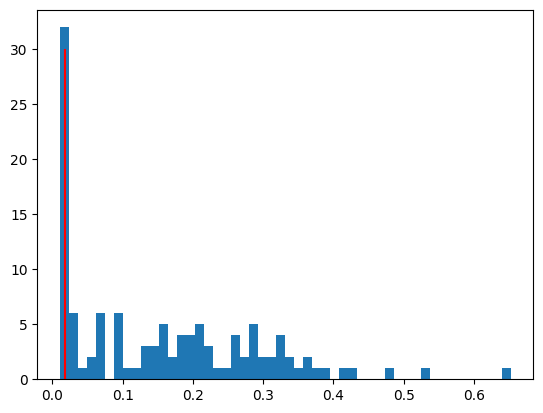

In [ ]:
plt.hist(y_score, bins=50)
plt.vlines(x=opt_thresh, color='r', ymin=0, ymax=30)
plt.show()

AUC-ROC Score:  0.9863563402889245


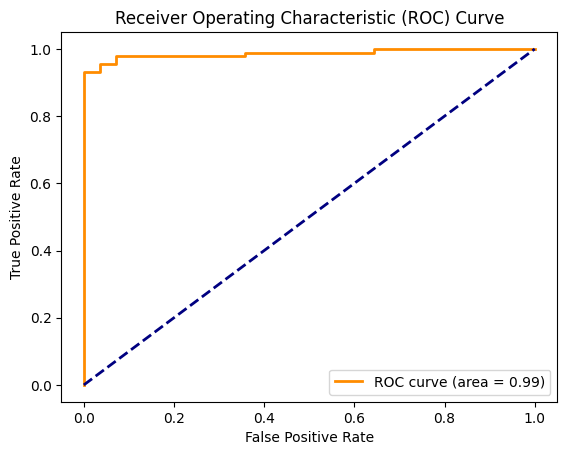

In [ ]:
from sklearn.metrics import roc_auc_score, roc_curve
import seaborn as sns

auc_roc_score = roc_auc_score(y_true, y_score)
print("AUC-ROC Score: ", auc_roc_score)

fpr, tpr, thresholds = roc_curve(y_true, y_score)
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % auc_roc_score)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

Optimal Threshold:  0.02170128


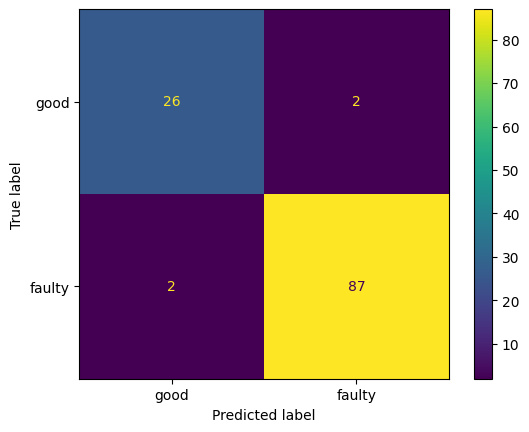

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, f1_score

f1_scores = [f1_score(y_true, y_score >= threshold) for threshold in thresholds]

opt_thresh = thresholds[np.argmax(f1_scores)]
print("Optimal Threshold: ", opt_thresh)

cm = confusion_matrix(y_true, (y_score >= opt_thresh).astype(int))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['good', 'faulty'])
disp.plot()
plt.show()

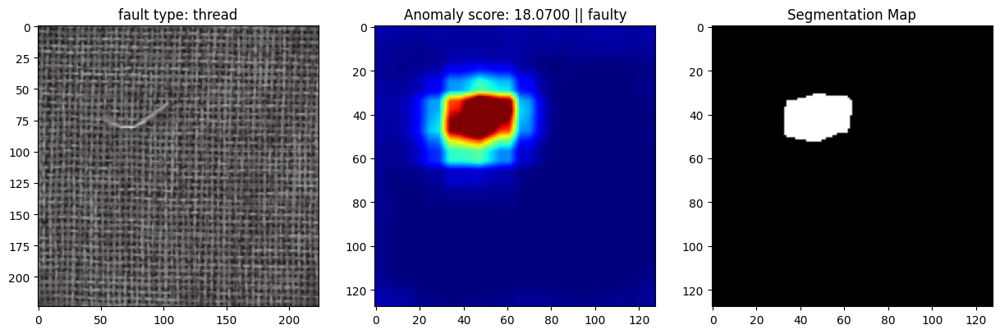

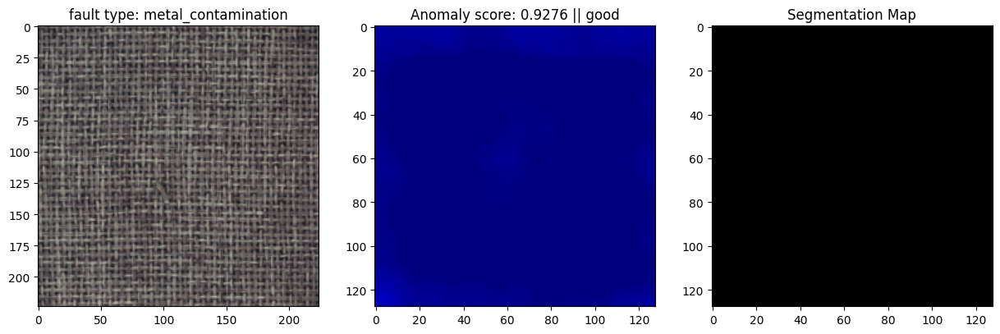

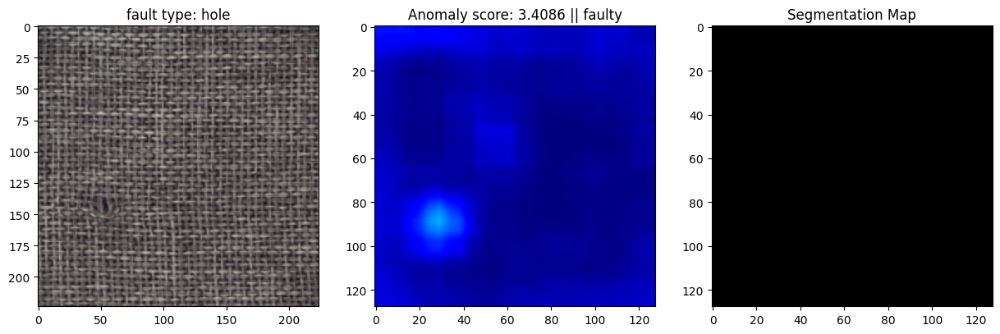

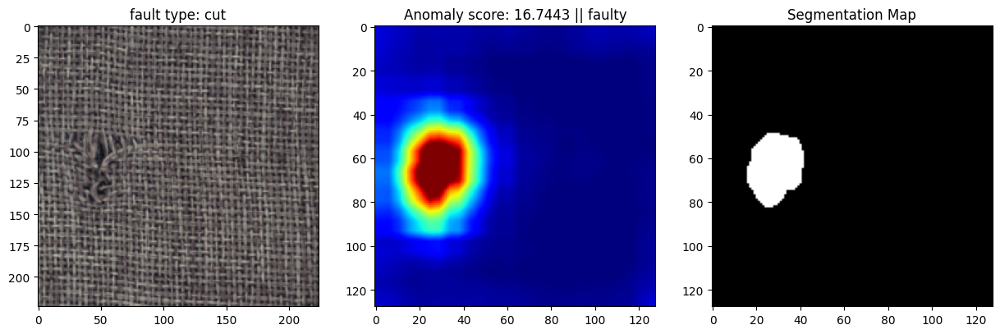

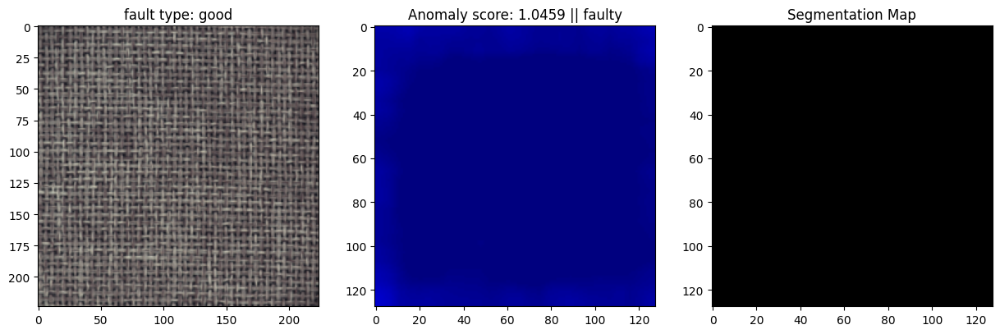

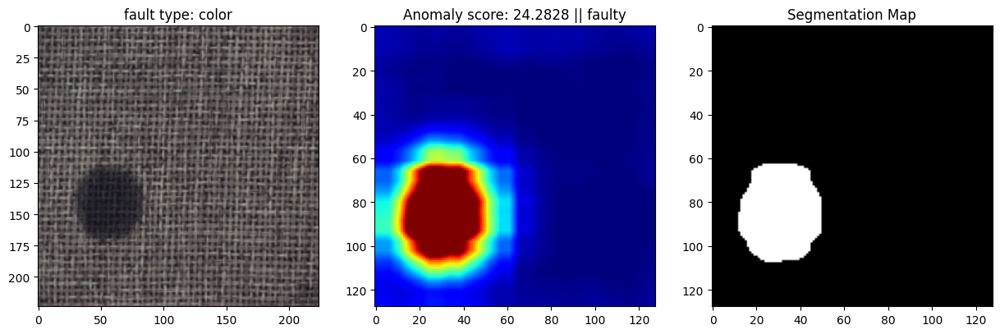

In [ ]:
import cv2
import torch
import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import clear_output
from pathlib import Path

model.eval()
backbone.eval()

test_path = Path('/content/carpet/test')

shown_types = set()

fault_types = ["color", "cut", "good", "hole", "metal_contamination", "thread"]
class_label = ['good', 'faulty']

for path in test_path.glob('*/*.png'):
    fault_type = path.parts[-2]

    if fault_type in shown_types:
        continue

    test_image = transform(Image.open(path)).cuda().unsqueeze(0)

    with torch.no_grad():
        features = backbone(test_image)
        recon = model(features)

    segm_map = ((features - recon)**2).mean(axis=(1))
    y_score_image = decision_function(segm_map=segm_map)
    y_pred_image = 1 * (y_score_image >= opt_thresh)

    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(test_image.squeeze().permute(1, 2, 0).cpu().numpy())
    plt.title(f'fault type: {fault_type}')

    plt.subplot(1, 3, 2)
    heat_map = segm_map.squeeze().cpu().numpy()
    heat_map = cv2.resize(heat_map, (128, 128))
    plt.imshow(heat_map, cmap='jet', vmin=heat_map_min, vmax=heat_map_max * 10)
    plt.title(f'Anomaly score: {y_score_image[0].cpu().numpy() / opt_thresh:0.4f} || {class_label[y_pred_image]}')

    plt.subplot(1, 3, 3)
    plt.imshow((heat_map > opt_thresh * 10), cmap='gray')
    plt.title('Segmentation Map')

    plt.show()

    shown_types.add(fault_type)

    if len(shown_types) == len(fault_types):
        break
